In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math 
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.impute import KNNImputer
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
#from sklearn.ensemble import IsolationForest


In [2]:
global_df=pd.read_excel(r"D:\DS Projects\2. Clustering Global Dvlp\World_development_mesurement.xlsx")
global_df.head()

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020,NaN,87931.0,Algeria,NaN,NaN,26998.0,"$54,790,058,957",0.035,$60,...,67.0,0.0,1,0.342,0.619,0.039,31719449,0.599,"$102,000,000","$193,000,000"
1,0.050,NaN,9542.0,Angola,NaN,NaN,7499.0,"$9,129,594,819",0.034,$22,...,44.0,0.0,1,0.476,0.499,0.025,13924930,0.324,"$34,000,000","$146,000,000"
2,0.043,NaN,1617.0,Benin,NaN,NaN,1983.0,"$2,359,122,303",0.043,$15,...,53.0,0.0,1,0.454,0.517,0.029,6949366,0.383,"$77,000,000","$50,000,000"
3,0.027,NaN,4276.0,Botswana,NaN,NaN,1836.0,"$5,788,311,645",0.047,$152,...,49.0,0.1,1,0.383,0.587,0.029,1755375,0.532,"$227,000,000","$209,000,000"
4,0.046,NaN,1041.0,Burkina Faso,NaN,NaN,NaN,"$2,610,959,139",0.051,$12,...,49.0,0.0,1,0.468,0.505,0.028,11607944,0.178,"$23,000,000","$30,000,000"


In [3]:
global_df.tail()

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
2699,NaN,NaN,NaN,Turks and Caicos Islands,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1,NaN,NaN,NaN,32427,0.911,NaN,NaN
2700,0.013,46.4%,NaN,United States,5.0,4.0,2132446.0,"$16,244,600,000,000",0.179,"$8,895",...,76.0,1.0,1,0.196,0.667,0.136,313873685,0.811,"$200,092,000,000","$126,573,000,000"
2701,0.015,41.9%,NaN,Uruguay,7.0,85.0,NaN,"$50,004,354,667",0.089,"$1,308",...,74.0,1.5,1,0.220,0.639,0.140,3395253,0.948,"$2,222,000,000","$1,028,000,000"
2702,0.020,61.9%,NaN,"Venezuela, RB",144.0,180.0,NaN,"$381,286,223,859",0.046,$593,...,72.0,1.0,1,0.288,0.652,0.060,29954782,0.889,"$904,000,000","$3,202,000,000"
2703,0.011,NaN,NaN,Virgin Islands (U.S.),NaN,NaN,NaN,NaN,NaN,NaN,...,76.0,NaN,1,0.206,0.641,0.152,105275,0.949,NaN,NaN


In [4]:
global_df.columns

Index(['Birth Rate', 'Business Tax Rate', 'CO2 Emissions', 'Country',
       'Days to Start Business', 'Ease of Business', 'Energy Usage', 'GDP',
       'Health Exp % GDP', 'Health Exp/Capita', 'Hours to do Tax',
       'Infant Mortality Rate', 'Internet Usage', 'Lending Interest',
       'Life Expectancy Female', 'Life Expectancy Male', 'Mobile Phone Usage',
       'Number of Records', 'Population 0-14', 'Population 15-64',
       'Population 65+', 'Population Total', 'Population Urban',
       'Tourism Inbound', 'Tourism Outbound'],
      dtype='object')

In [5]:
global_df.shape

(2704, 25)

In [6]:
global_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2704 entries, 0 to 2703
Data columns (total 25 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Birth Rate              2585 non-null   float64
 1   Business Tax Rate       1423 non-null   object 
 2   CO2 Emissions           2125 non-null   float64
 3   Country                 2704 non-null   object 
 4   Days to Start Business  1718 non-null   float64
 5   Ease of Business        185 non-null    float64
 6   Energy Usage            1785 non-null   float64
 7   GDP                     2494 non-null   object 
 8   Health Exp % GDP        2395 non-null   float64
 9   Health Exp/Capita       2395 non-null   object 
 10  Hours to do Tax         1416 non-null   float64
 11  Infant Mortality Rate   2444 non-null   float64
 12  Internet Usage          2531 non-null   float64
 13  Lending Interest        1880 non-null   float64
 14  Life Expectancy Female  2568 non-null   

In [7]:
global_df.isnull().sum()

Birth Rate                 119
Business Tax Rate         1281
CO2 Emissions              579
Country                      0
Days to Start Business     986
Ease of Business          2519
Energy Usage               919
GDP                        210
Health Exp % GDP           309
Health Exp/Capita          309
Hours to do Tax           1288
Infant Mortality Rate      260
Internet Usage             173
Lending Interest           824
Life Expectancy Female     136
Life Expectancy Male       136
Mobile Phone Usage         167
Number of Records            0
Population 0-14            220
Population 15-64           220
Population 65+             220
Population Total             0
Population Urban            26
Tourism Inbound            368
Tourism Outbound           471
dtype: int64

In [8]:
global_df.describe()

,Birth Rate,CO2 Emissions,Days to Start Business,Ease of Business,Energy Usage,Health Exp % GDP,Hours to do Tax,Infant Mortality Rate,Internet Usage,Lending Interest,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban
count,2585.000000,2.125000e+03,1718.000000,185.000000,1.785000e+03,2395.000000,1416.000000,2444.000000,2531.000000,1880.000000,2568.000000,2568.000000,2537.000000,2704.0,2484.000000,2484.000000,2484.000000,2.704000e+03,2678.000000
mean,0.022715,1.423071e+05,39.999418,94.875676,7.723684e+04,0.064170,302.068503,0.032813,0.239747,0.148103,71.159268,66.461838,0.578124,1.0,0.303051,0.623481,0.073465,3.145729e+07,0.562953
std,0.011338,6.159288e+05,57.318588,54.791906,2.599239e+05,0.026325,273.299686,0.029968,0.260132,0.171829,10.708262,9.390217,0.474647,0.0,0.106577,0.069660,0.049541,1.242894e+08,0.245897
min,0.007000,7.000000e+00,1.000000,1.000000,8.000000e+00,0.008000,12.000000,0.002000,0.000000,0.005000,39.000000,37.000000,0.000000,1.0,0.118000,0.474000,0.003000,1.887600e+04,0.082000
25%,0.013000,1.360000e+03,13.000000,48.000000,3.737000e+03,0.046000,156.000000,0.009000,0.000000,0.080000,64.000000,61.000000,0.100000,1.0,0.204750,0.559000,0.033000,8.783360e+05,0.356000
50%,0.020000,8.529000e+03,26.000000,94.000000,1.433800e+04,0.061000,239.000000,0.020000,0.100000,0.120000,75.000000,69.000000,0.500000,1.0,0.299500,0.642500,0.052000,5.800324e+06,0.560000
75%,0.031000,5.910800e+04,45.000000,142.000000,4.185200e+04,0.079000,344.750000,0.053000,0.400000,0.173000,79.000000,73.250000,0.900000,1.0,0.402000,0.676000,0.112000,2.014089e+07,0.765000
max,0.053000,8.286892e+06,694.000000,189.000000,2.727728e+06,0.225000,2600.000000,0.141000,1.000000,4.965000,87.000000,88.000000,2.900000,1.0,0.500000,0.858000,0.244000,1.350695e+09,1.000000


In [9]:
# remove % from Business Tax Rate to make it str to float. 
# remove $ from GDP	and Health Exp/Capita to make it object-float.
# drop Number of Records
# remove $ from Tourism Inbound and Tourism Outbound to make it object-float.

In [10]:
# imputation technique to be implemented : 
# out of total 2705 rows-- we have 2519 nulls in 'Ease of business' suggesting to drop it.
# Business Tax Rate and Hours to do Tax can also be dropped followed by 1281 and 1288 null rows. 
# rest we shall replace with median to prevent skweness and outliers. 
# Same value(1) is present in all rows in 'Number of Records' columns suggesting to drop it 

In [11]:
# Data Imputation

# 1. drop column with high null values. 
df= global_df.drop(['Ease of Business','Number of Records'],axis=1)      #categorical column is not required in clustering 

#removing '%', '$', ',' or unnecessary spaces
def clean_numeric_columns(dataframe):
    """
    - Removing '$', '%', ',' and extra spaces
    - Converting columns to float dtype
    """
    column = ['Business Tax Rate','GDP','Health Exp/Capita','Tourism Inbound','Tourism Outbound']
    
    for col in column:
        # Apply cleaning only to object (string) columns
        if dataframe[col].dtype == 'object':
            dataframe[col] = (
                dataframe[col]
                .astype(str)
                .str.replace(r'[\$,%,]', '', regex=True)  # remove $, %, commas
                .str.strip()                              # remove leading/trailing spaces
            )
            # Convert cleaned strings to numeric (NaN if not convertible)
            dataframe[col] = pd.to_numeric(dataframe[col], errors='coerce')
    
    return dataframe.head(2), dataframe.info()


In [12]:
clean_numeric_columns(df)          #CLeaned columns are converted into float dtype

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2704 entries, 0 to 2703
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Birth Rate              2585 non-null   float64
 1   Business Tax Rate       1423 non-null   float64
 2   CO2 Emissions           2125 non-null   float64
 3   Country                 2704 non-null   object 
 4   Days to Start Business  1718 non-null   float64
 5   Energy Usage            1785 non-null   float64
 6   GDP                     2494 non-null   float64
 7   Health Exp % GDP        2395 non-null   float64
 8   Health Exp/Capita       2395 non-null   float64
 9   Hours to do Tax         1416 non-null   float64
 10  Infant Mortality Rate   2444 non-null   float64
 11  Internet Usage          2531 non-null   float64
 12  Lending Interest        1880 non-null   float64
 13  Life Expectancy Female  2568 non-null   float64
 14  Life Expectancy Male    2568 non-null   

(   Birth Rate  Business Tax Rate  CO2 Emissions  Country  \
 0        0.02                NaN        87931.0  Algeria   
 1        0.05                NaN         9542.0   Angola   
 
    Days to Start Business  Energy Usage           GDP  Health Exp % GDP  \
 0                     NaN       26998.0  5.479006e+10             0.035   
 1                     NaN        7499.0  9.129595e+09             0.034   
 
    Health Exp/Capita  Hours to do Tax  ...  Life Expectancy Female  \
 0               60.0              NaN  ...                    71.0   
 1               22.0              NaN  ...                    47.0   
 
    Life Expectancy Male  Mobile Phone Usage  Population 0-14  \
 0                  67.0                 0.0            0.342   
 1                  44.0                 0.0            0.476   
 
    Population 15-64  Population 65+  Population Total  Population Urban  \
 0             0.619           0.039          31719449             0.599   
 1             0.499 

In [13]:
# Create a LabelEncoder object for categorical column
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

# Fit and transform the "Country" column in the DataFrame
df['Country_encoded'] = le.fit_transform(df['Country'])

In [14]:
df.drop('Country',axis=1,inplace=True)   #droping categorical column and keeping the encoded one 

In [15]:
#Handling Null values using KNN Imputation 
imputer = KNNImputer(n_neighbors=5)
df_imputed = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)

print("After Imputation - Missing Values:", df_imputed.isnull().sum().sum())

After Imputation - Missing Values: 0


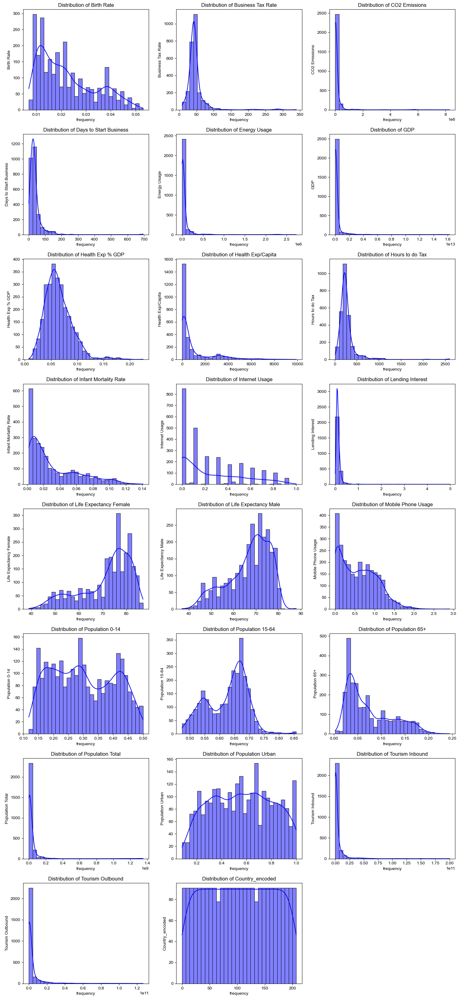

In [16]:
n_col=3
n_row=math.ceil(len(global_df.columns)/n_col)

plt.figure(figsize=(5*n_col,4*n_row))

for i,col in enumerate(df_imputed.columns,1): 
    plt.subplot(n_row,n_col,i)
    sns.histplot(df_imputed[col],kde=True,bins=30,color='blue',line_kws={'color':'lightgreen'})
    plt.title(f"Distribution of {col}")
    plt.xlabel("frequency")
    plt.ylabel(f"{col}")

plt.tight_layout()
sns.set_style('whitegrid')
plt.show()

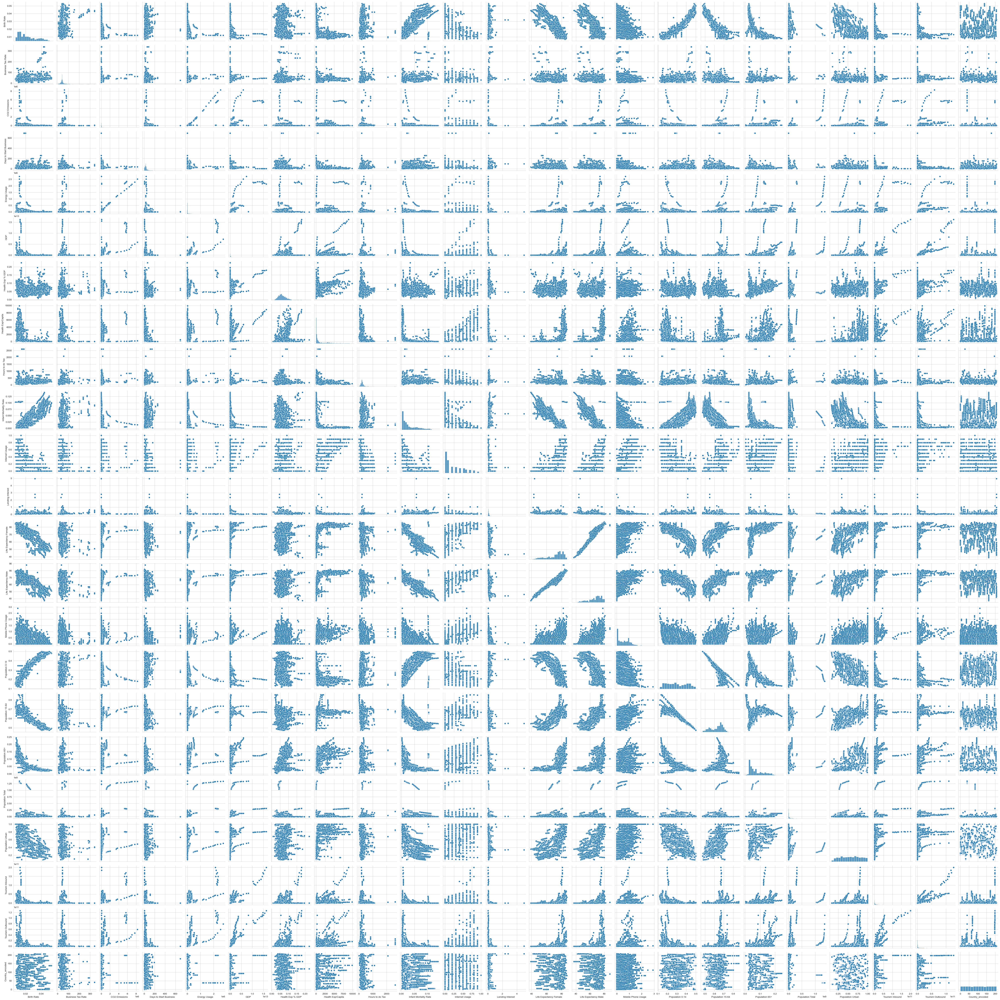

In [17]:
sns.pairplot(df_imputed)

Text(0.5, 1.0, 'Outlier detection')

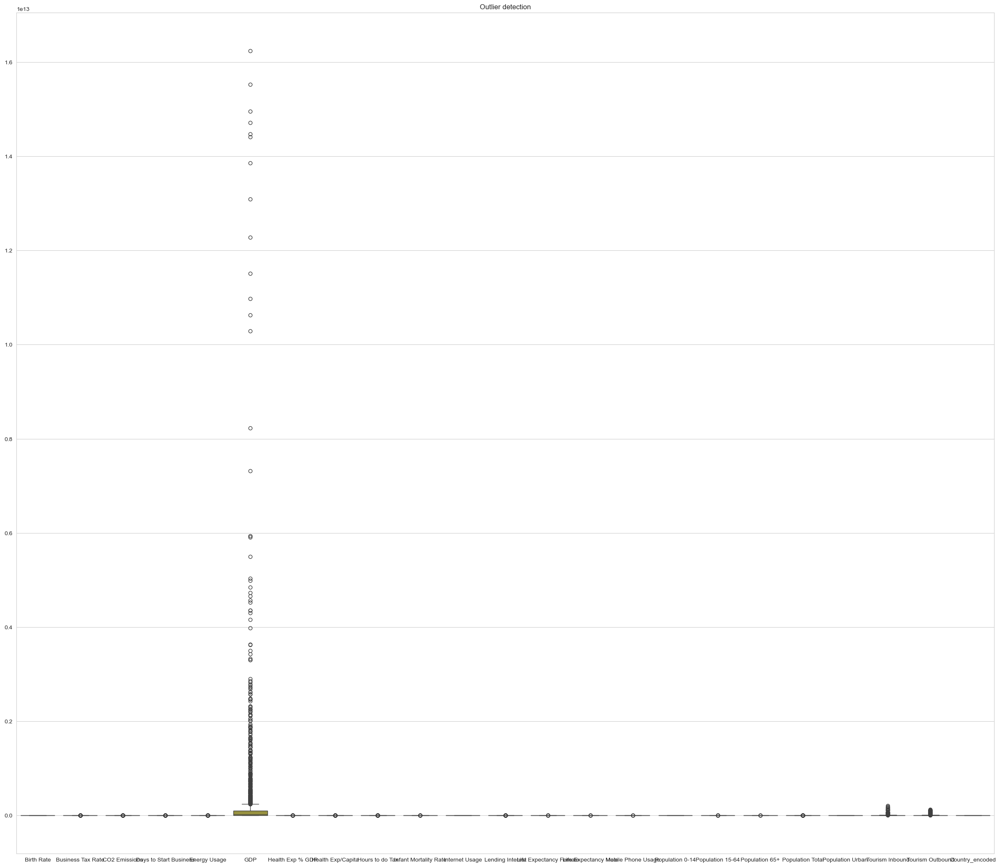

In [18]:
plt.figure(figsize=(30,26))
sns.boxplot(df_imputed)
plt.title("Outlier detection")

# Data Preprocessing

In [20]:
#Outlier Handling using IQR Method -- Winsorize Outliers 

Q1= df[col].quantile(0.25)
Q3= df[col].quantile(0.75)
IQR= Q3 - Q1
Upper_fence= Q3 + 1.5 * IQR
Lower_fence= Q1 - 1.5 * IQR

# Winsorize (cap outliers between lower outliers to lower boundry and upper outliers to upper boundry)
df_clean = df_imputed.clip(lower=Lower_fence, upper=Upper_fence, axis=1)
print("Outliers has been Winsorize successfully :>")

Outliers has been Winsorize successfully :>


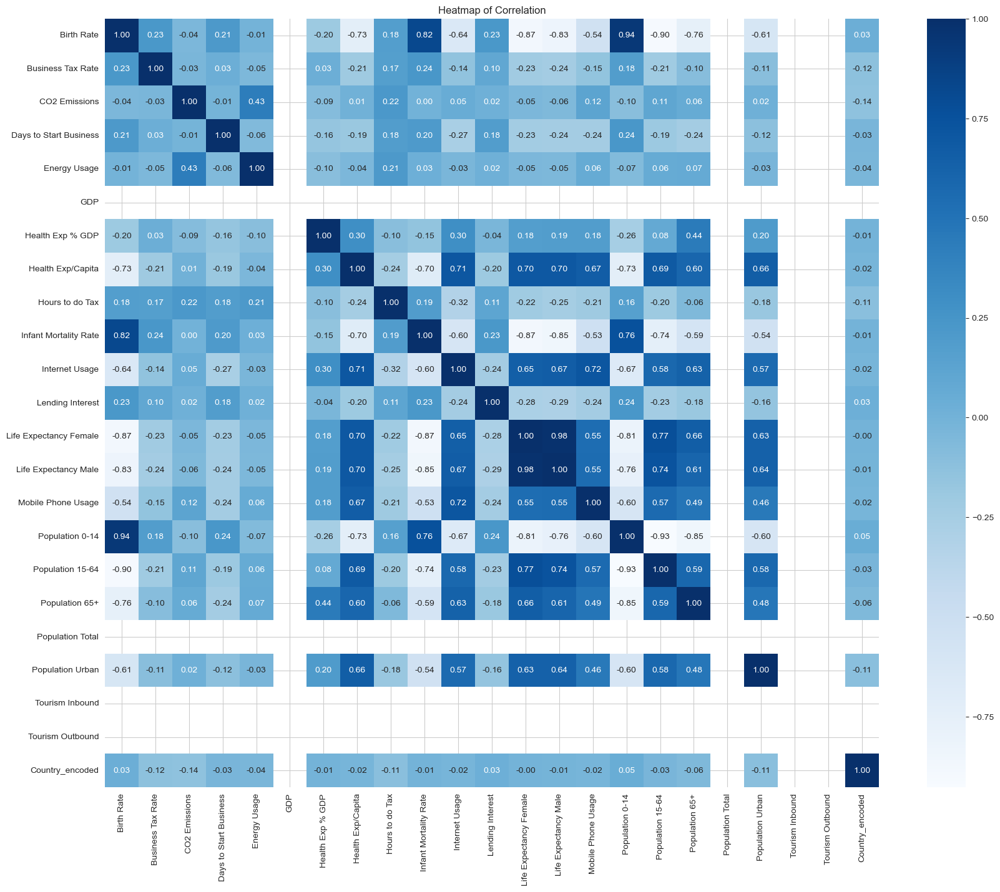

In [21]:
corr = df_clean.corr()
plt.figure(figsize=(20,16))
sns.heatmap(corr,annot=True,fmt=".2f",cmap='Blues')
plt.title("Heatmap of Correlation")
plt.show()

In [22]:
# Scaling (for clustering)

scaler = StandardScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df_clean), columns=df_clean.columns)

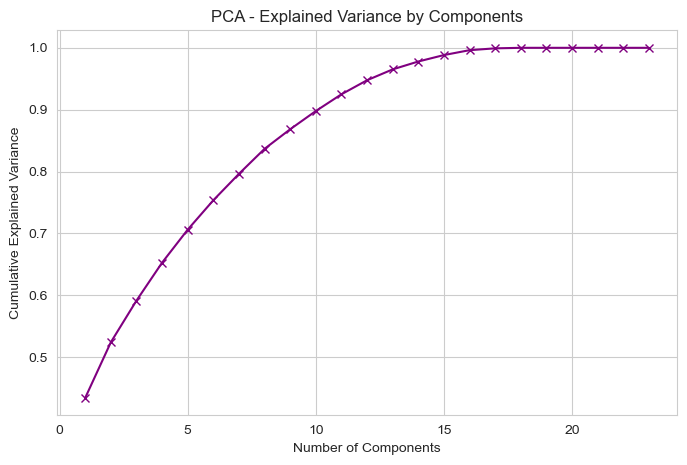

In [23]:
# PCA for dimensionality reduction 

pca = PCA()
pca_fit = pca.fit(df_scaled)

# Explained variance ratio
explained_var = np.cumsum(pca.explained_variance_ratio_)

plt.figure(figsize=(8,5))
plt.plot(range(1, len(explained_var)+1), explained_var, marker='x', color='purple')
plt.title("PCA - Explained Variance by Components")
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance")
plt.grid(True)
plt.show()

In [24]:
# Choose number of components explaining 90-95% variance
n_components = np.argmax(explained_var >= 0.95) + 1
print(f"Number of PCA components explaining 95% variance: {n_components}")

# Transform data
pca = PCA(n_components=n_components)
pca_data = pca.fit_transform(df_scaled)
df_pca = pd.DataFrame(pca_data, columns=[f"PC{i+1}" for i in range(n_components)])

Number of PCA components explaining 95% variance: 13


In [25]:
df_pca

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13
0,1.363915,1.315190,-0.333459,1.172617,-1.594777,0.709268,-0.106002,-1.240576,0.223818,0.236960,0.497366,0.074214,0.146620
1,6.603705,0.972696,1.117454,0.721166,2.197530,-3.494011,1.698400,-3.260073,1.040087,-0.065915,-0.902928,0.809735,1.027504
2,4.595516,0.535966,0.108817,-0.090366,-1.221818,-0.797270,-0.831944,-0.328158,-0.309452,0.187591,-0.003899,0.244169,0.734132
3,2.926827,0.612221,-0.096237,0.101127,-0.798821,-1.078536,-0.519888,-0.708494,-0.441261,-0.072711,0.030435,1.065484,-0.456435
4,5.389119,0.650569,1.249437,-0.664894,-1.367280,-0.086252,0.015179,-0.078827,-0.215193,-0.179472,-0.310218,0.067777,0.386492
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,-2.174767,-4.488525,-0.940516,1.387208,-0.640451,0.568869,1.112562,0.346210,1.124517,-0.413491,0.812246,0.720626,0.736863
2700,-3.998250,-0.976867,2.420141,-2.294892,2.120624,0.323977,-1.127156,0.896917,-0.557500,0.291948,1.112150,-0.643458,-0.362531
2701,-3.111805,0.478734,0.631363,-0.936901,1.365479,0.598618,0.160323,1.197432,1.603793,0.569343,0.285680,0.347003,0.250180
2702,-1.196431,0.669373,-1.028586,2.107812,1.258841,-0.612740,0.360734,3.152765,0.410832,0.766801,0.223387,-0.282238,0.207429


In [26]:
# t-sne for dimensionality reduction 
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, perplexity=30, random_state=42)
df_tsne = tsne.fit_transform(df_scaled)

# Converting to DataFrame for easy use
df_tsne = pd.DataFrame(df_tsne, columns=['TSNE1', 'TSNE2'])

# `Dimensionality reduction (PCA vs T-SNE)`
**1. PCA :**
   - Principal Component Analysis (PCA) `Linear dimensionality reduction technique` by identifying and projecting the data into the principal components that capture the maximum variance in the data.
   - Works well for global patterns but may not capture local clusters effectively, Sensitive to Outliers , Preserves Variance.
   - PCA is best for feature extraction and preserving global structures.

**2. T-SNE :**
   - t-SNE is a `non-linear dimensionality reduction technique` specifically designed for visualizing high-dimensional data in 2D or 3D spaces. It works by modellingfocuses pairwise similarities between data points in the high-dimensional space and optimizing their representation in a lower-dimensional space to preserve these similarities.
   - Preserves local structure (clusters) of data,  More robust to outliers , Preserves distances rather than variance (controlled by hyperparameters).
   - t-SNE is ideal for visualizing clusters in high-dimensional data.


# Model Building (using PCA dataset)

# *1. K-Means Clustering - Elbow Method*

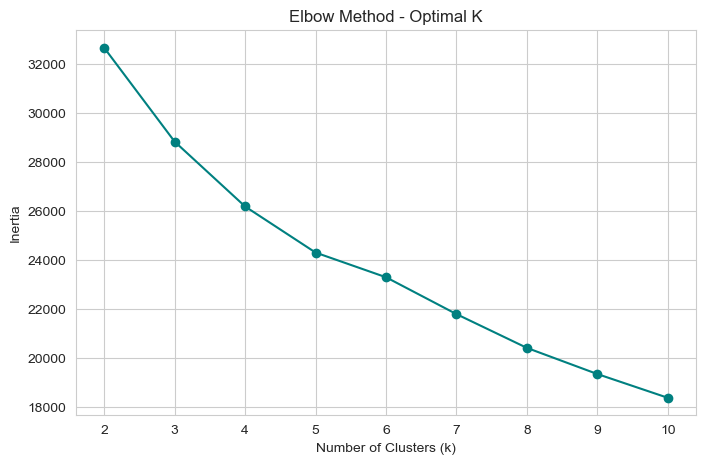

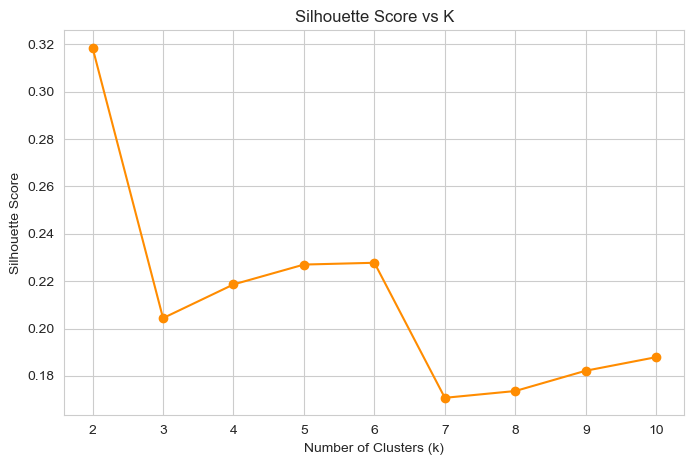

In [30]:
inertia = []
silhouette = []

K_range = range(2, 11)
for k in K_range:
    model = KMeans(n_clusters=k, random_state=42, n_init=10)
    model.fit(df_pca)
    inertia.append(model.inertia_)
    silhouette.append(silhouette_score(df_pca, model.labels_))

# Elbow plot
plt.figure(figsize=(8,5))
plt.plot(K_range, inertia, marker='o', color='teal')
plt.title("Elbow Method - Optimal K")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia")
plt.show()

# Silhouette plot
plt.figure(figsize=(8,5))
plt.plot(K_range, silhouette, marker='o', color='darkorange')
plt.title("Silhouette Score vs K")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Silhouette Score")
plt.show()

In [31]:
# Choose optimal K and fit final model

optimal_k = silhouette.index(max(silhouette)) + 2           # since range starts at 2
print(f"Optimal number of clusters (based on silhouette): {optimal_k}")

kmeans_final = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
cluster_labels = kmeans_final.fit_predict(df_pca)

df_pca["Cluster"] = cluster_labels

Optimal number of clusters (based on silhouette): 2


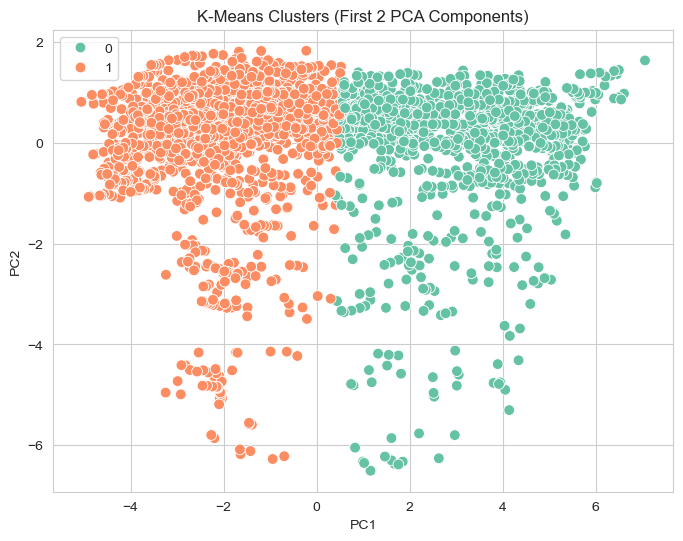

In [32]:
# Visualization (2D PCA plot)

plt.figure(figsize=(8,6))
sns.scatterplot(x="PC1", y="PC2", hue="Cluster", data=df_pca, palette="Set2", s=60)
plt.title("K-Means Clusters (First 2 PCA Components)")
plt.legend()
plt.show()

In [33]:
# 5. Cluster Profiling (Feature means)   -- to know which cluster represents which feature using mean

df_with_clusters = pd.concat([df_scaled, df_pca["Cluster"]], axis=1)
cluster_profile = df_with_clusters.groupby("Cluster").mean()
print("\n Cluster Feature Means:\n", cluster_profile.round(2))


 Cluster Feature Means:
          Birth Rate  Business Tax Rate  CO2 Emissions  Days to Start Business  \
Cluster                                                                         
0              0.98               0.20          -0.07                    0.29   
1             -0.68              -0.14           0.05                   -0.20   

         Energy Usage  GDP  Health Exp % GDP  Health Exp/Capita  \
Cluster                                                           
0                0.02  0.0             -0.27              -0.96   
1               -0.02  0.0              0.18               0.66   

         Hours to do Tax  Infant Mortality Rate  ...  Life Expectancy Male  \
Cluster                                          ...                         
0                   0.23                   0.90  ...                 -0.92   
1                  -0.16                  -0.62  ...                  0.63   

         Mobile Phone Usage  Population 0-14  Population 15-64  \
C

# *2. Agglomerative / Hierarchical Clustering* 

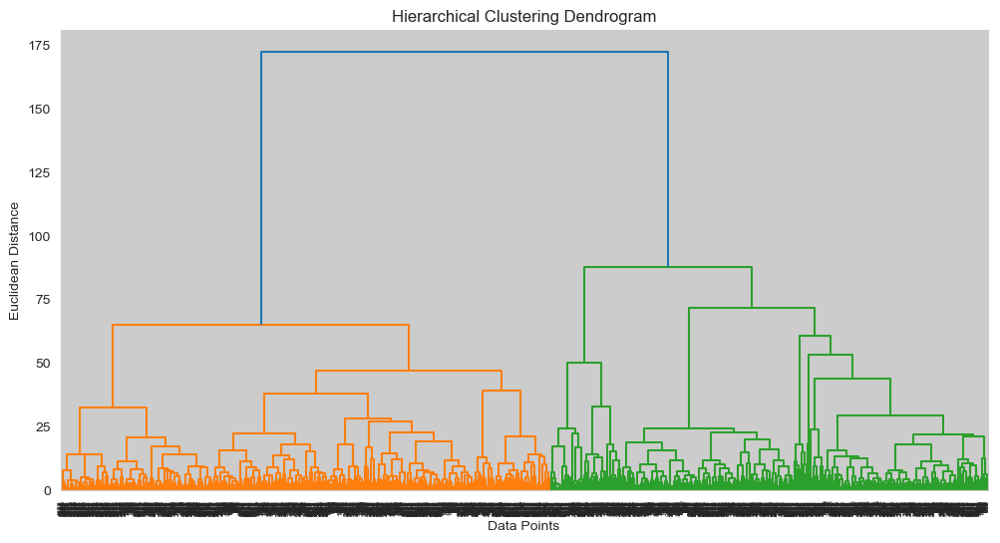

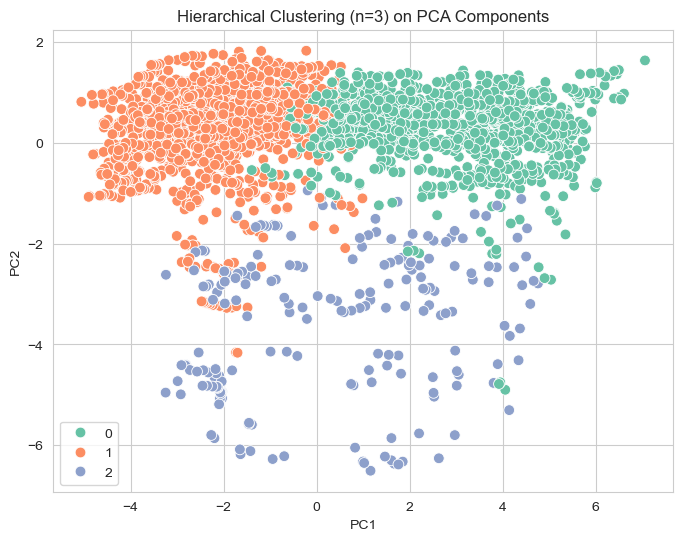


 Hierarchical Cluster Feature Means:
               Birth Rate  Business Tax Rate  CO2 Emissions  \
Hier_Cluster                                                 
0                   0.93               0.22           0.23   
1                  -0.71              -0.15           0.14   
2                   0.15              -0.08          -2.18   

              Days to Start Business  Energy Usage  GDP  Health Exp % GDP  \
Hier_Cluster                                                                
0                               0.28          0.21  0.0             -0.31   
1                              -0.24          0.23  0.0              0.17   
2                               0.17         -2.70  0.0              0.44   

              Health Exp/Capita  Hours to do Tax  Infant Mortality Rate  ...  \
Hier_Cluster                                                             ...   
0                         -0.92             0.28                   0.88  ...   
1                       

In [35]:
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.cluster import AgglomerativeClustering

# Dendrogram (to visualize cluster hierarchy)

plt.figure(figsize=(12, 6))
linkage_matrix = linkage(df_pca.iloc[:, :-1], method='ward')      #as 'Cluster' column is not present
dendrogram(linkage_matrix)
plt.title("Hierarchical Clustering Dendrogram")
plt.xlabel("Data Points")
plt.ylabel("Euclidean Distance")
plt.show()

# Choose number of clusters after observing dendrogram
n_clusters_hier = 3  

# Fit Agglomerative Clustering
hier_model = AgglomerativeClustering(n_clusters=n_clusters_hier, metric='euclidean', linkage='ward')
hier_labels = hier_model.fit_predict(df_pca.iloc[:, :-1])

df_pca['Hier_Cluster'] = hier_labels

# Visualization of model using scatter plot
plt.figure(figsize=(8,6))
sns.scatterplot(
    x="PC1", y="PC2",
    hue="Hier_Cluster",
    data=df_pca,
    palette="Set2",
    s=60
)
plt.title(f"Hierarchical Clustering (n={n_clusters_hier}) on PCA Components")
plt.legend()
plt.show()

# Cluster Profiling
df_with_hier = pd.concat([df_scaled, df_pca["Hier_Cluster"]], axis=1)
hier_profile = df_with_hier.groupby("Hier_Cluster").mean()
print("\n Hierarchical Cluster Feature Means:\n", hier_profile.round(2))


# *DBSCAN Clustering*

In [37]:
from sklearn.cluster import DBSCAN

 Best EPS value: 4.50, with silhouette score: 0.396


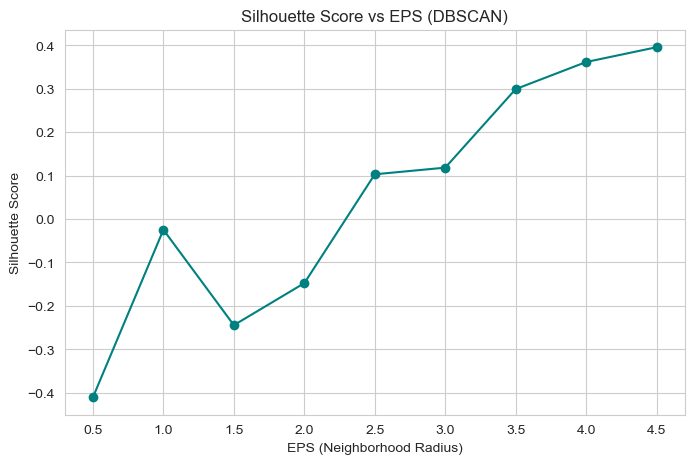

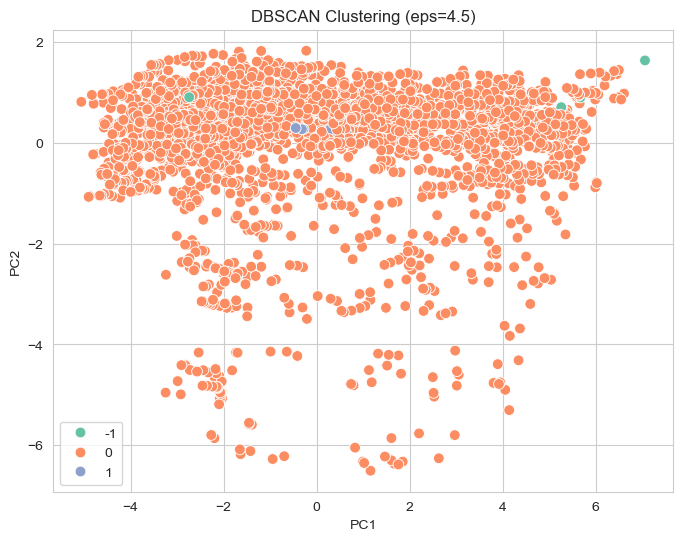

In [38]:
# Trying multiple eps values

eps_values = np.arange(0.5, 5.1, 0.5)
silhouette_scores = []

for eps in eps_values:
    db = DBSCAN(eps=eps, min_samples=5)
    labels = db.fit_predict(df_pca.iloc[:, :-1])
    
    # Count clusters excluding noise
    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    
    # Only compute if we have at least 2 clusters
    if n_clusters > 1:
        score = silhouette_score(df_pca.iloc[:, :-1], labels)
    else:
        score = np.nan
    
    silhouette_scores.append(score)

# Check if at least one valid silhouette score exists
if all(np.isnan(silhouette_scores)):
    print("All silhouette scores are NaN. Try reducing min_samples or lowering eps range.")
else:
    best_eps_index = np.nanargmax(silhouette_scores)
    best_eps = eps_values[best_eps_index]
    best_score = silhouette_scores[best_eps_index]
    print(f" Best EPS value: {best_eps:.2f}, with silhouette score: {best_score:.3f}")

    # Plot Silhouette vs EPS
    plt.figure(figsize=(8,5))
    plt.plot(eps_values, silhouette_scores, marker='o', color='teal')
    plt.title("Silhouette Score vs EPS (DBSCAN)")
    plt.xlabel("EPS (Neighborhood Radius)")
    plt.ylabel("Silhouette Score")
    plt.show()

# Fit final DBSCAN model
dbscan_final = DBSCAN(eps=best_eps, min_samples=5)
db_labels = dbscan_final.fit_predict(df_pca.iloc[:, :-1])

df_pca['DBSCAN_Cluster'] = db_labels

# Visualize clusters in PCA space
plt.figure(figsize=(8,6))
sns.scatterplot(
    x="PC1", y="PC2",
    hue="DBSCAN_Cluster",
    data=df_pca,
    palette="Set2",
    s=60
)
plt.title(f"DBSCAN Clustering (eps={best_eps})")
plt.legend()
plt.show()

# *Evaluation of Cluster Models (on PCA dataset)* 

In [40]:
from sklearn import metrics

In [41]:
df_pca.columns

Index(['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10',
       'PC11', 'PC12', 'PC13', 'Cluster', 'Hier_Cluster', 'DBSCAN_Cluster'],
      dtype='object')

In [42]:
# 1. Kmean Cluster

metrics.silhouette_score(df_pca.iloc[:,:-3],kmeans_final.labels_)    #-3 to not add recently added last 3 cluster columns in evaluation
#0.3185

0.3185319832102776

In [43]:
# 2. Hierarchical Cluster

metrics.silhouette_score(df_pca.iloc[:,:-3],hier_model.labels_) 
#0.2928

0.29889807144963926

In [44]:
# 3. DBSCAN Cluster

metrics.silhouette_score(df_pca.iloc[:,:-3],dbscan_final.labels_) 
#0.3900

0.3983531445023077

In [45]:
df_pca.columns

Index(['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10',
       'PC11', 'PC12', 'PC13', 'Cluster', 'Hier_Cluster', 'DBSCAN_Cluster'],
      dtype='object')

# Model Building (using T-SNE dataset)

# *1. K-Means Clustering - Elbow Method*

In [48]:
df_tsne 

,TSNE1,TSNE2
0,8.934578,31.087765
1,76.512726,15.879235
2,52.676842,-12.041010
3,39.721256,-6.087770
4,55.785400,-16.376759
...,...,...
2699,10.058123,-62.052120
2700,-73.086670,5.047902
2701,-64.593811,23.431490
2702,15.679830,-9.250735


# Perform clustering with KMeans
kmeans = KMeans(n_clusters = 3, init = 'k-means++', random_state = 42)
k_labels = kmeans.fit_predict(df_tsne)          #labels

# add labels as column in dataframe to visualize
df_tsne['K_Labels'] = k_labels

# Plot the cluster  
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df_tsne[:,0], y=df_tsne[:,1], hue=k_labels, data=df_tsne, palette="viridis", s=50)
plt.title('K-means Clustering: Visualization of 3 Clusters')
plt.xlabel('T-sne dimension 1')
plt.ylabel('T-sne dimension 2')
plt.legend(title='Clusters')
plt.show()

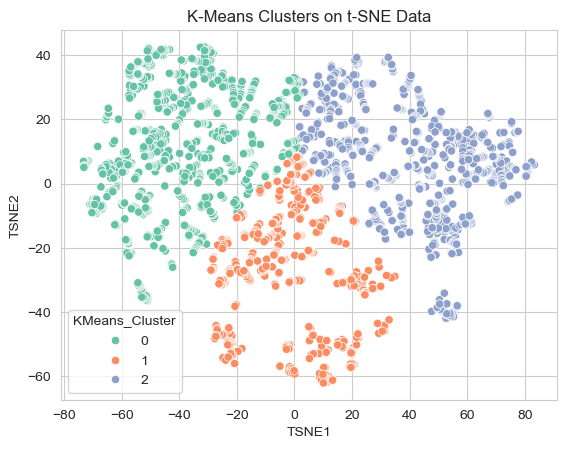

In [50]:
kmeans_tsne = KMeans(n_clusters=3, random_state=42)
df_tsne['KMeans_Cluster'] = kmeans_tsne.fit_predict(df_tsne[['TSNE1', 'TSNE2']])

#labels
k_labels = kmeans_tsne.fit_predict(df_tsne[['TSNE1', 'TSNE2']])

sns.scatterplot(x='TSNE1', y='TSNE2', hue='KMeans_Cluster', data=df_tsne, palette='Set2')
plt.title("K-Means Clusters on t-SNE Data")
plt.show()

# *2. Agglomerative / Hierarchical Clustering* 

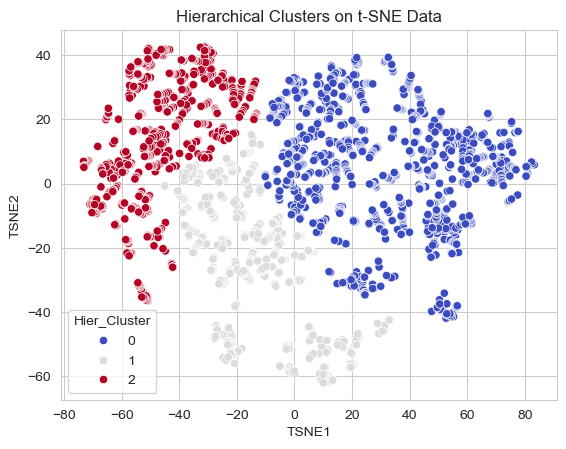

In [52]:
hier_tsne = AgglomerativeClustering(n_clusters=3)
df_tsne['Hier_Cluster'] = hier_tsne.fit_predict(df_tsne[['TSNE1', 'TSNE2']])

#Labels
Hier_labels = hier_tsne.fit_predict(df_tsne[['TSNE1', 'TSNE2']])

sns.scatterplot(x='TSNE1', y='TSNE2', hue='Hier_Cluster', data=df_tsne, palette='coolwarm')
plt.title("Hierarchical Clusters on t-SNE Data")
plt.show()

# *DBSCAN Clustering*

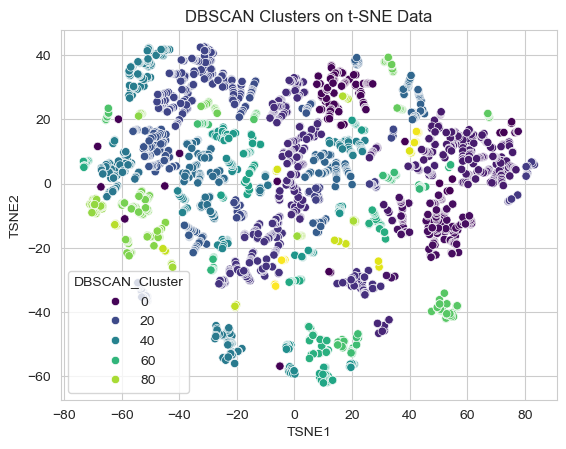

In [54]:
dbscan_tsne = DBSCAN(eps=3, min_samples=5)
df_tsne['DBSCAN_Cluster'] = dbscan_tsne.fit_predict(df_tsne[['TSNE1', 'TSNE2']])

#Labels
db_labels = dbscan_tsne.fit_predict(df_tsne[['TSNE1', 'TSNE2']])

sns.scatterplot(x='TSNE1', y='TSNE2', hue='DBSCAN_Cluster', data=df_tsne, palette='viridis')
plt.title("DBSCAN Clusters on t-SNE Data")
plt.show()

# *Evaluation of Cluster Models (on T-SNE dataset)* 

In [56]:
# 1. Kmean tsne Cluster
metrics.silhouette_score(df_tsne,k_labels)

0.3296406406794081

In [57]:
# 2. Hierarchical tsne CLuster
metrics.silhouette_score(df_tsne,Hier_labels)

0.299865074052279

In [58]:
# 3. DBSCAN tsne CLsuter
metrics.silhouette_score(df_tsne,db_labels)

0.5137588861537947

# Compare clusters 
**Quick Comparison Analysis to find the best cluster among all**

By using evaluation matrix - Silhouette score we got following results: 

**K-Mean Cluster :**
- performed moderately well. Improved a bit with t-sne (from 0.32 - 0.33)
- Indicates compact but somewhat overlapping clusters
- Can be used for simple interpretable model. (Good cluster)

**Hierarchical Clsuter :**
- Lowest Silhouette in both cases (approx. 0.30)
- Suggests less distinct boundaries between clusters (works well on small dataset)
- Not ideal for deployment or further classification (Bad Cluster)

**DBSCAN Cluster :**
- Highest silhouette overall, especially with t-SNE (0.51) -- shows strong seperation in t-sne space
- Captures non-linear, irregular-shaped clusters effectively.
- Automatically detects noise/outliers, which helps build cleaner cluster boundaries.
- Can be the best choice for our data (Great Cluster)

Hence, we would like to go ahead with `DBSCAN cluster with T-SNE`


# Classification Model - XGboost Classifier

For classification it sounds more accurate to go with `XGboost Classifier` because it handles non-linear relationships well and performs great on small–medium data

In [61]:
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [62]:
X = df_scaled.copy()  # or df_tsne[['TSNE1', 'TSNE2']] for visualization-based features
Y = df_tsne['DBSCAN_Cluster']

In [63]:
# Remove noise points if DBSCAN labeled -1
X = X[Y != -1]
Y = Y[Y != -1]

In [64]:
#Split the dataset
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42, stratify=Y)   
                                                             #stratify to maintain the proportion of y while spiliting training & testing data
X_train.shape,X_test.shape,Y_train.shape,Y_test.shape

((2128, 23), (533, 23), (2128,), (533,))

# LGBM 

In [66]:
# --- Step 3: Define base model ---
lgb = LGBMClassifier(random_state=42)

# Defining hyperparameter grid 
param_dist = {
    'num_leaves': [20, 30, 40, 50],
    'max_depth': [3, 4, 5, 6, -1],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [100, 200, 300],
    'subsample': [0.7, 0.8, 1.0],
    'colsample_bytree': [0.7, 0.8, 1.0]
}

# Randomized Search for speed 
random_search = RandomizedSearchCV(
    estimator=lgb,
    param_distributions=param_dist,
    n_iter=20,               # limits total combinations → keeps fast
    scoring='accuracy',
    cv=3,
    verbose=1,
    n_jobs=-1,
    random_state=42
)

# Fit model 
random_search.fit(X_train, Y_train)

Fitting 3 folds for each of 20 candidates, totalling 60 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000196 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2762
[LightGBM] [Info] Number of data points in the train set: 2128, number of used features: 19
[LightGBM] [Info] Start training from score -3.220287
[LightGBM] [Info] Start training from score -6.053500
[LightGBM] [Info] Start training from score -2.990109
[LightGBM] [Info] Start training from score -4.444062
[LightGBM] [Info] Start training from score -5.871178
[LightGBM] [Info] Start training from score -5.465713
[LightGBM] [Info] Start training from score -2.448002
[LightGBM] [Info] Start training from score -5.360353
[LightGBM] [Info] Start training from score -4.667206
[LightGBM] [Info] Sta

RandomizedSearchCV(cv=3, estimator=LGBMClassifier(random_state=42), n_iter=20,
                   n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.7, 0.8, 1.0],
                                        'learning_rate': [0.01, 0.05, 0.1],
                                        'max_depth': [3, 4, 5, 6, -1],
                                        'n_estimators': [100, 200, 300],
                                        'num_leaves': [20, 30, 40, 50],
                                        'subsample': [0.7, 0.8, 1.0]},
                   random_state=42, scoring='accuracy', verbose=1)

In [67]:
# Evaluate best model 
best_lgb = random_search.best_estimator_

print(" Best Parameters found:\n", random_search.best_params_)
print("\n Best Cross-Validation Accuracy: ", random_search.best_score_)

 Best Parameters found:
 {'subsample': 0.7, 'num_leaves': 40, 'n_estimators': 100, 'max_depth': -1, 'learning_rate': 0.1, 'colsample_bytree': 1.0}

 Best Cross-Validation Accuracy:  0.9356218174112848


In [68]:
# --- Step 8: Test evaluation ---
Y_pred = best_lgb.predict(X_test)

print("\n Test Accuracy:", accuracy_score(Y_test, Y_pred))
print("\n Classification Report:\n", classification_report(Y_test, Y_pred))
print("\n Confusion Matrix:\n", confusion_matrix(Y_test, Y_pred))


 Test Accuracy: 0.9530956848030019

 Classification Report:
               precision    recall  f1-score   support

           0       0.95      1.00      0.98        21
           1       1.00      1.00      1.00         1
           2       1.00      0.96      0.98        27
           3       1.00      1.00      1.00         6
           4       0.00      0.00      0.00         1
           5       1.00      1.00      1.00         2
           6       1.00      0.96      0.98        46
           7       1.00      1.00      1.00         2
           8       0.83      1.00      0.91         5
           9       1.00      0.33      0.50         3
          10       0.84      1.00      0.91        26
          11       0.93      1.00      0.97        14
          12       0.80      1.00      0.89        12
          13       1.00      0.96      0.98        28
          14       1.00      0.50      0.67         2
          15       1.00      1.00      1.00         3
          16       

C:\Anaconda\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Anaconda\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Anaconda\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


# XGBM 

In [74]:
# XGBoost model - by hyperparameter tunning
xgb = XGBClassifier(random_state=42, eval_metric='mlogloss')   # mlogloss : used for multiclass classification problems.
                                                               # It is a measure ofthe performance of a classification model where the prediction
                                                               # output is a probability value between 0 and 1.
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 4, 5, 6],
    'subsample': [0.7, 0.8, 1.0],
    'colsample_bytree': [0.7, 0.8, 1.0]                        # controls the column subsampling ratio when constructing each tree. (prevent overfitting by introducing randomness in the feature selection)
}

# Randomized Search
random_search1 = RandomizedSearchCV(
    estimator=xgb,
    param_distributions=param_grid,
    n_iter=20,                                                 # number of random combinations
    scoring='accuracy',
    cv=3,
    n_jobs=-1,
    random_state=42,
    verbose=1
)
random_search1.fit(X_train, Y_train)

Fitting 3 folds for each of 20 candidates, totalling 60 fits


RandomizedSearchCV(cv=3,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric='mlogloss',
                                           feature_types=None,
                                           feature_weights=None, gamma=None,
                                           grow_policy=None,
                                           importance_type=None,
                                           interaction_con...
                                           min_child_weight=None, missing=nan,
                                           monotone_constraints=None,
                                           multi_strategy=None,
                                           n_estimators=None, n_jobs=None,
                                           num_parallel_tree=None, ...),
                   n_iter=20, n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.7, 0.8, 1.0],
                                        'learning_rate': [0.01, 0.05, 0.1],
                                        'max_depth': [3, 4, 5, 6],
                                        'n_estimators': [100, 200, 300],
                                        'subsample': [0.7, 0.8, 1.0]},
                   random_state=42, scoring='accuracy', verbose=1)

In [76]:
# Evaluate best model 
best_xgb = random_search1.best_estimator_

print(" Best Parameters found:\n", random_search1.best_params_)
print("\n Best Cross-Validation Accuracy: ", random_search1.best_score_)

 Best Parameters found:
 {'subsample': 0.7, 'n_estimators': 300, 'max_depth': 3, 'learning_rate': 0.1, 'colsample_bytree': 0.8}

 Best Cross-Validation Accuracy:  0.9304528629227172


In [78]:
# Predict X test
Y_pred1 = best_xgb.predict(X_test)

In [80]:
print("Accuracy:", accuracy_score(Y_test, Y_pred1))
print("\n Classification Report:\n", classification_report(Y_test, Y_pred1))
print("\n Confusion Matrix:\n", confusion_matrix(Y_test, Y_pred1))

Accuracy: 0.9643527204502814

 Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.95      0.95        21
           1       1.00      1.00      1.00         1
           2       1.00      1.00      1.00        27
           3       1.00      1.00      1.00         6
           4       0.00      0.00      0.00         1
           5       1.00      1.00      1.00         2
           6       0.98      0.93      0.96        46
           7       1.00      1.00      1.00         2
           8       0.80      0.80      0.80         5
           9       1.00      1.00      1.00         3
          10       0.90      1.00      0.95        26
          11       0.93      1.00      0.97        14
          12       0.86      1.00      0.92        12
          13       1.00      1.00      1.00        28
          14       1.00      0.50      0.67         2
          15       1.00      1.00      1.00         3
          16       0.75   

C:\Anaconda\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Anaconda\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Anaconda\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


# Comparing Classifier models :
**LGBM vs XGBM**

Cross-validation Accuracy --> LGBM (0.94) | XGBM (0.93)

Test Accuracy    -->	LGBM (0.95) |	XGBM (0.96)

Macro Avg F1-score	--> LGBM (0.91) | XGBM (0.92)

Weighted Avg F1-score --> LGBM (0.95) | XGBM (0.96)

**Insights**
- XGBoost achieved a slightly higher test accuracy (96.4% vs. 95.3%)
- LightGBM is significantly faster
- Class-level Performance:
  Both models perform excellently on most classes, but both struggle on rare cluster classes (low support) — expected behavior since DBSCAN can create small or noisy clusters.
- Both models confirm high separability of DBSCAN clusters (t-SNE features), validating our unsupervised --> supervised hybrid pipeline.

**Plan for next Step**
- LGBM is faster but as XGBM performed slight better in accuracy.
- We will know `deploy our model using XGboost Model`
- Whereas, we retain XGBoost as a benchmark backup model (as already perpared) 

   

# Deployment 